In [1]:
import numpy as np
import collections
import SimpleITK as sitk
from scipy.ndimage.interpolation import zoom
import os,sys
import pandas as pd
from keras.preprocessing import image
from tensorflow.keras.utils import load_img, img_to_array 
import tensorflow as tf
import matplotlib.pyplot as plt
from skimage.transform import resize
import six
import xlsxwriter

/var/folders/pk/9c8hksy91dbc32vckyljkbpw0000gn/T/ipykernel_74497/1266407960.py:4: DeprecationWarning: Please use `zoom` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  from scipy.ndimage.interpolation import zoom


In [2]:
import numpy as np
from matplotlib import pyplot as plt
import cv2

from keras import backend as K
from keras.applications import imagenet_utils
from tensorflow.keras.applications.resnet50 import ResNet50
from keras.preprocessing import image
from keras.applications.imagenet_utils import preprocess_input, decode_predictions

In [3]:
import glob

In [4]:
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.imagenet_utils import preprocess_input, decode_predictions
from tensorflow.keras.models import Model
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2

from tensorflow.keras.applications.inception_v3 import InceptionV3

from tensorflow.keras.applications.resnet50 import ResNet50
#from tensorflow.keras.applications.imagenet_utils import preprocess_input, decode_predictions
from tensorflow.keras.applications.xception import Xception
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.applications.vgg16 import VGG16



model = ResNet50(weights='imagenet', include_top=False)


#fc

#model = VGG16(weights='imagenet', include_top=False)

#fc
#base_model = ResNet50(weights='imagenet', include_top=True)
#from keras.models import Model
#model = Model(inputs=base_model.input, outputs=base_model.layers[-1].output)

2024-01-20 15:12:06.684207: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1
2024-01-20 15:12:06.684231: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 8.00 GB
2024-01-20 15:12:06.684236: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 2.67 GB
2024-01-20 15:12:06.684309: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:303] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-01-20 15:12:06.684353: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:269] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [5]:
def slice(mask_array):
    max=0
    index=0
    for i in range(0,mask_array.shape[0]):
        input_list=np.sum(mask_array[i,:,:])
        if input_list>max:
            max=input_list
            index=i
    return index

def maskcroppingbox(images_array, use2D=False):
    images_array_2 = np.argwhere(images_array)
    (zstart, ystart, xstart), (zstop, ystop, xstop) = images_array_2.min(axis=0), images_array_2.max(axis=0) + 1
    return (zstart, ystart, xstart), (zstop, ystop, xstop)

patientlist=pd.read_excel('/Volumes/PortableSSD/DS_meningioma/S100_Results/Sonuc/NF2All.xlsx','Sheet1')

featureDict = {}
for name in patientlist.Table:
    imageFilepath = ('/Volumes/PortableSSD/DS_meningioma/Registration_FLAIR/'+'S0036'+'_SWI_IMAGES.nii')
    imagepath = sitk.ReadImage((imageFilepath),sitk.sitkFloat32)
    maskFilepath = ('/Volumes/PortableSSD/DS_meningioma/Registration_FLAIR/'+'S0036'+'_seg.nii.gz')
    maskpath = sitk.ReadImage((maskFilepath),sitk.sitkFloat32)
    image_array = sitk.GetArrayFromImage(imagepath) 
    mask_array = sitk.GetArrayFromImage(maskpath)
    (zstart, ystart, xstart), (zstop, ystop, xstop) = maskcroppingbox(mask_array, use2D=False)
    index=slice(mask_array)
    roi_images = image_array[[index-1,index,index+1],ystart-3:ystop+3,xstart-3:xstop+3].transpose((2,1,0))
    #roi_images = roi_images[:,:,int(roi_images.shape[2])]
    roi_images1 = resize(roi_images,(224, 224, 3))
    roi_images2 = np.array(roi_images1,dtype='float')


In [46]:
import keras
from keras.applications import ResNet50
from keras.layers import Input
from keras.models import Model
from keras.utils import plot_model
import tensorflow as tf

# Load the ResNet-50 model without the top (classification) layer
base_model = ResNet50(weights='imagenet', include_top=False)

# Create a custom function to group convolutional layers into blocks
def get_convolution_blocks(model):
    blocks = []
    current_block = []
    
    for layer in model.layers:
        if isinstance(layer, keras.layers.Conv2D):
            current_block.append(layer)
        else:
            if current_block:
                blocks.append(current_block)
                current_block = []
    
    if current_block:
        blocks.append(current_block)
    
    return blocks

# Create a custom model to visualize convolutional blocks
input_tensor = Input(shape=(224, 224, 64))  # Use 64 channels to match the first convolutional layer
blocks = get_convolution_blocks(base_model)

output_tensors = []

for idx, block in enumerate(blocks):
    x = input_tensor
    for layer in block:
        x = layer(x)
    
    # Create a sub-model for each convolutional block
    block_model = Model(inputs=input_tensor, outputs=x)
    output_tensors.append(block_model(input_tensor))

# Create the final custom model by concatenating outputs of convolutional blocks
if output_tensors:
    custom_model = Model(inputs=input_tensor, outputs=tf.keras.layers.Concatenate()(output_tensors))
else:
    custom_model = Model(inputs=input_tensor, outputs=[])

# Create a simplified visualization for the convolutional blocks
plot_model(custom_model, to_file='resnet50_conv_blocks.png', show_shapes=True, show_layer_names=False, rankdir='LR')

print("ResNet-50 convolutional blocks visualization saved as resnet50_conv_blocks.png")



ValueError: Exception encountered when calling layer "conv1_conv" (type Conv2D).

Depth of input (64) is not a multiple of input depth of filter (3) for '{{node conv1_conv/Conv2D}} = Conv2D[T=DT_FLOAT, data_format="NHWC", dilations=[1, 1, 1, 1], explicit_paddings=[], padding="VALID", strides=[1, 2, 2, 1], use_cudnn_on_gpu=true](Placeholder, conv1_conv/Conv2D/ReadVariableOp)' with input shapes: [?,224,224,64], [7,7,3,64].

Call arguments received by layer "conv1_conv" (type Conv2D):
  • inputs=tf.Tensor(shape=(None, 224, 224, 64), dtype=float32)

In [41]:
import keras
import tensorflow as tf
from keras.applications import ResNet50
from keras.layers import Input, Lambda
from keras.models import Model
from keras.utils import plot_model

# Load the ResNet-50 model without the top (classification) layer
base_model = ResNet50(weights='imagenet', include_top=False)

# Define a custom function to create visualization layers
def add_visualization_layers(layer):
    x = layer.output
    shape = x.shape[1:]
    x = Lambda(lambda x: keras.backend.tile(x, (1, 1, 1, 3)))(x)  # Replicate the feature maps 3 times for RGB-like visualization
    x = Lambda(lambda x: tf.image.resize(x, (shape[1], shape[2])))(x)  # Resize for visualization
    return keras.layers.Input(shape=shape), x

# Create a custom model with visualization layers for convolution blocks
input_tensor = Input(shape=(224, 224, 3))
subset_layers = base_model.layers[:5]  # Include the first five layers

x = input_tensor
for layer in subset_layers:
    if isinstance(layer, keras.layers.Conv2D):
        input_shape, x = add_visualization_layers(layer)
    else:
        x = layer(x)

custom_model = Model(inputs=input_tensor, outputs=x)

# Create a simplified visualization for the selected layers with input shape and convolution block shapes
plot_model(custom_model, to_file='resnet50_conv_blocks.png', show_shapes=True, show_layer_names=False, rankdir='LR')

print("ResNet-50 architecture with convolution block shapes saved as resnet50_conv_blocks.png")



ValueError: Exception encountered when calling layer "lambda_3" (type Lambda).

'size' must be a 1-D int32 Tensor

Call arguments received by layer "lambda_3" (type Lambda):
  • inputs=tf.Tensor(shape=(None, None, None, 192), dtype=float32)
  • mask=None
  • training=None

In [ ]:
import matplotlib.pyplot as plt

# Split the merged slices into three separate slices
slice1 = roi_images2[:, :, 0] * 255  # First slice
slice2 = roi_images2[:, :, 1] * 255  # Second slice
slice3 = roi_images2[:, :, 2] * 255  # Third slice

# Plot each slice separately
plt.figure(figsize=(8, 12))  # Adjust the figsize to control the overall size of the plot

# First Slice
plt.subplot(311)  # 3 rows, 1 column, first subplot
plt.imshow(slice1, cmap='gray')
plt.title("First Slice")
plt.axis('off')

# Second Slice
plt.subplot(312)  # 3 rows, 1 column, second subplot
plt.imshow(slice2, cmap='gray')
plt.title("Second Slice")
plt.axis('off')

# Third Slice
plt.subplot(313)  # 3 rows, 1 column, third subplot
plt.imshow(slice3, cmap='gray')
plt.title("Third Slice")
plt.axis('off')

plt.tight_layout()  # Adjust subplot spacing
plt.show()


In [ ]:
# Split the merged slices into three separate slices
slice1 = roi_images2[:, :, 0]*255  # First slice
slice2 = roi_images2[:, :, 1]*255  # Second slice
slice3 = roi_images2[:, :, 2]*255  # Third slice

# Plot each slice separately
plt.figure(figsize=(12, 4))

# First Slice
plt.subplot(111)
plt.imshow(slice1, cmap='gray')
plt.title("First Slice")
plt.axis('off')

# Second Slice
plt.subplot(211)
plt.imshow(slice2, cmap='gray')
plt.title("Second Slice")
plt.axis('off')

# Third Slice
plt.subplot(311)
plt.imshow(slice3, cmap='gray')
plt.title("Third Slice")
plt.axis('off')

plt.show()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming roi_images2 contains the merged slices
merged_slices = roi_images2  # Scale to 0-255 range for displaying as an image

# Plot the merged slices
plt.figure(figsize=(12, 4))
plt.imshow(merged_slices.astype(np.uint8))  # Ensure data type is uint8 for proper display
plt.title("Merged Slices")
plt.axis('off')
plt.show()


In [ ]:
import matplotlib.pyplot as plt
from skimage.transform import resize
import numpy as np
import pandas as pd
import SimpleITK as sitk

# ... Your existing code ...

# Assuming you have loaded the image and extracted the ROI as 'roi_images2'

roi_images = image_array[slice(mask_array)-1,ystart-3:ystop+3,xstart-3:xstop+3].transpose((2,1,0))
roi_images = roi_images[:,:,int(roi_images.shape[2]/2)]
roi_images = resize(roi_images,(224, 224, 3))
roi_images = np.array(roi_images,dtype='float')
roi_images1 = image_array[slice(mask_array),ystart-3:ystop+3,xstart-3:xstop+3].transpose((2,1,0))
roi_images1 = roi_images1[:,:,int(roi_images1.shape[2]/2)]
roi_images1 = resize(roi_images1,(224, 224, 3))
roi_images1 = np.array(roi_images1,dtype='float')
roi_images2 = image_array[slice(mask_array)+1,ystart-3:ystop+3,xstart-3:xstop+3].transpose((2,1,0))
roi_images2 = roi_images2[:,:,int(roi_images2.shape[2]/2)]
roi_images2 = resize(roi_images2,(224, 224, 3))
roi_images2 = np.array(roi_images2,dtype='float')
# Split the ROI into individual channels
red_channel = roi_images[:, :, 0]
green_channel = roi_images1[:, :, 1]
blue_channel = roi_images2[:, :, 2]

# Plot each channel separately
plt.figure(figsize=(12, 4))

# Red Channel
plt.subplot(131)
plt.imshow(red_channel, cmap='gray')
plt.title("Red Channel")
plt.axis('off')

# Green Channel
plt.subplot(132)
plt.imshow(green_channel, cmap='gray')
plt.title("Green Channel")
plt.axis('off')

# Blue Channel
plt.subplot(133)
plt.imshow(blue_channel, cmap='gray')
plt.title("Blue Channel")
plt.axis('off')

plt.show()

In [ ]:
# Assuming you have loaded the image and extracted the ROI as 'roi_images2'

# Split the ROI into individual channels
red_channel = roi_images[:, :, 0]
green_channel = roi_images1[:, :, 0]  # Update channel index if necessary
blue_channel = roi_images2[:, :, 0]   # Update channel index if necessary

# Plot each channel separately
plt.figure(figsize=(12, 4))

# Red Channel
plt.subplot(131)
plt.imshow(red_channel, cmap='gray')
plt.title("Red Channel")
plt.axis('off')

# Green Channel
plt.subplot(132)
plt.imshow(green_channel, cmap='gray')
plt.title("Green Channel")
plt.axis('off')

# Blue Channel
plt.subplot(133)
plt.imshow(blue_channel, cmap='gray')
plt.title("Blue Channel")
plt.axis('off')

plt.show()


In [ ]:
patientlist=pd.read_excel('/Volumes/PortableSSD/DS_meningioma/S100_Results/Sonuc/NF2All.xlsx','Sheet1')

In [ ]:
featureDict = {}
for name in patientlist.Table:
    imageFilepath = ('/Volumes/PortableSSD/DS_meningioma/Registration_FLAIR/'+name+'_SWI_IMAGES.nii')
    imagepath = sitk.ReadImage((imageFilepath),sitk.sitkFloat32)
    maskFilepath = ('/Volumes/PortableSSD/DS_meningioma/Registration_FLAIR/'+name+'_seg.nii.gz')
    maskpath = sitk.ReadImage((maskFilepath),sitk.sitkFloat32)
    image_array = sitk.GetArrayFromImage(imagepath) 
    mask_array = sitk.GetArrayFromImage(maskpath)
    (zstart, ystart, xstart), (zstop, ystop, xstop) = maskcroppingbox(mask_array, use2D=False)
    roi_images = image_array[slice(mask_array)-1:slice(mask_array)+1,ystart-3:ystop+3,xstart-3:xstop+3].transpose((2,1,0))
    roi_images = roi_images[:,:,int(roi_images.shape[2]/2)]
    roi_images1 = resize(roi_images,(224, 224, 3))
    roi_images2 = np.array(roi_images1,dtype='float')
    x = tf.keras.utils.img_to_array(roi_images2)
    x = tf.keras.applications.resnet50.preprocess_input(x)
    x = np.expand_dims(x, axis=0)
    base_model_pool_features = model.predict(x)
    feature_map = base_model_pool_features[0]
    feature_map = feature_map.transpose((2,1,0))
    features = np.max(feature_map,-1)
    features = np.max(features,-1)
    deeplearningfeatures = collections.OrderedDict()
    for ind_,f_ in enumerate(features):
        deeplearningfeatures[str(ind_)] = f_
    result = deeplearningfeatures
    key = list(result.keys())
    key = key[0:]
        
    feature = []
    for jind in range(len(key)):
        feature.append(result[key[jind]])
        
    featureDict[name] = feature
    dictkey = key
    print(name)
    # Create a Pandas Excel writer using XlsxWriter as the engine.
dataframe = pd.DataFrame.from_dict(featureDict, orient='index', columns=dictkey)
dataframe.to_excel('/Volumes/PortableSSD/DS_meningioma/Makale/FeaturesResnetNF2.xlsx')
#os.chdir('/Volumes/PortableSSD/DS_meningiom

In [ ]:
# Extract the features for the selected patient
selected_features = featureDict['S0002']

# Create a bar plot to visualize the extracted features
plt.figure(figsize=(10, 6))
plt.bar(range(len(selected_features)), selected_features)
plt.xlabel("Feature Index")
plt.ylabel("Feature Value")
plt.title(f"Extracted Features")
plt.show()

In [ ]:
# Debugging: Print array dimensions and slicing indices
print("Image array shape:", image_array.shape)
print("Mask array shape:", mask_array.shape)
print("zstart:", zstart, "zstop:", zstop)
print("ystart:", ystart, "ystop:", ystop)
print("xstart:", xstart, "xstop:", xstop)

# Slice the array
roi_images = image_array[zstart:zstop, ystart:ystop, xstart:xstop].transpose((2, 1, 0))


In [ ]:
class_output = preds[:, class_index]


2024-02-27 12:26:49.491206: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1
2024-02-27 12:26:49.491234: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 8.00 GB
2024-02-27 12:26:49.491246: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 2.67 GB
2024-02-27 12:26:49.491329: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:303] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-02-27 12:26:49.491375: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:269] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


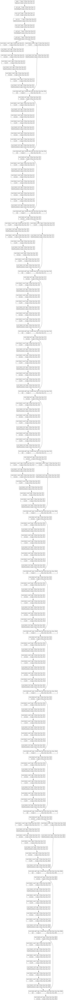

In [1]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.utils import plot_model

# Load ResNet50 model without the fully connected layers
model = ResNet50(weights='imagenet', include_top=False)

# Plot the model architecture
plot_model(model, to_file='resnet50.png', show_shapes=True, show_layer_names=True)


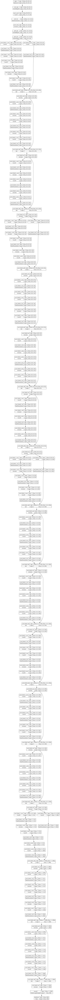

In [2]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.utils import plot_model

# Load ResNet50 model with the fully connected layers
model = ResNet50(weights='imagenet', include_top=True)

# Plot the model architecture
plot_model(model, to_file='resnet50_complete.png', show_shapes=True, show_layer_names=True)


In [3]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import GlobalMaxPooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model

# Load ResNet50 model without the top fully connected layers
base_model = ResNet50(weights='imagenet', include_top=False)

# Apply Global Max Pooling after each layer
outputs = []
for layer in base_model.layers:
    x = layer.output
    x = GlobalMaxPooling2D()(x)
    outputs.append(x)

# Create a new model with modified architecture
model = Model(inputs=base_model.input, outputs=outputs)

# Plot the modified model architecture
plot_model(model, to_file='resnet50_with_gmp.png', show_shapes=True, show_layer_names=True)


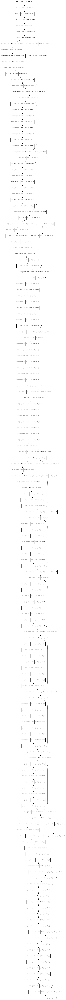

In [4]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.utils import plot_model

# Load ResNet50 model without the top fully connected layers
base_model = ResNet50(weights='imagenet', include_top=False)

# Plot the base ResNet50 model architecture
plot_model(base_model, to_file='resnet50_base.png', show_shapes=True, show_layer_names=True)